# 3. word2vec

이번 장의 주제 또한 단어의 분산 표현이다.

앞 장에서는 '통계 기반 기법'으로 단어의 분산 표현을 얻었는데, 이번 장에서는 더 강력한 기법인 '추론 기반 기법'을 살펴볼 것이다.

이름에서 알 수 있듯이 추론 기반 기법은 추론을 하는 기법이다. 이 추론 과정에서 **신경망을 이용**하는데, 여기서 word2vec이 등장한다. 이번 장에서는 word2vec의 구조를 차분히 들여다보고 구현해보며 확실하게 이해해보고자 한다.

이번 장의 목표는 **단순한** word2vec 구현하기이다. 처리 효율을 희생하는 대신 이해하기 쉽도록 구성해서 단순한 word2vec이다. 큰 데이터셋까지는 어렵겠지만 작은 데이터셋이라면 문제없이 처리할 수 있다. 다음 장에서는 이번 장의 단순한 word2vec에 몇 가지 개선을 더해 진짜 word2vec을 완성시킨다.

## 추론 기반 기법과 신경망

단어를 벡터로 표현하는 방법은 지금까지 활발히 연구되었다. 그중에서도 성공적인 기법들을 크게 두 부류로 나눌 수 있는데, 바로 '통계 기반 기법'과 '추론 기반 기법'이다. 단어의 의미를 얻는 방식은 서로 크게 다르지만, 그 배경에는 모두 **분포 가설**이 있다.

이번 절에서는 통계 기반 기법의 문제를 지적하고, 그 대안인 추론 기반 기법의 이점을 거시적 관점에서 설명한다. 그런 다음 word2vec의 전처리를 위해 신경망으로 단어를 처리하는 예를 보여주겠다.

### 통계 기반 기법의 문제점

지금까지 본 것처럼 통계 기반 기법에서는 **주변 단어의 빈도를 기초**로 단어를 표현했다. 구체적으로는 단어의 동시발생 행렬을 만들고, 그 행렬에 SVD를 적용하여 밀집벡터(단어의 분산 표현)를 얻었다. 그러나 이 방식은 대규모 말뭉치를 다룰 때 문제가 발생한다.

현업에서 다루는 말뭉치의 어휘 수는 어마어마하다. 예컨대 영어의 어휘 수는 100만을 훌쩍 넘어간다. 어휘가 100만 개라면, 통계 기반 기법에서는 '100만 x 100만'이라는 거대한 행렬을 만들게 된다. 이런 거대 행렬에 SVD를 적용하는 일은 현실적이지 않다.

통계 기반 기법은 말뭉치 전체의 통계(동시발생 행렬과 PPMI 등)를 이용해 단 1회의 처리(SVD 등)만에 단어의 분산 표현을 얻는다.

한편, 추론 기반 기법에서는, 예컨대 신경망을 이용하는 경우에는 **미니배치로 학습하는 것이 일반적**이다. 미니배치 학습에서는 신경망이 한 번에 소량(미니배치)의 학습 샘플씩 반복해서 학습하며 가중치를 갱신해나간다.

추론 기반 기법은 학습 데이터의 일부를 사용하기 때문에 말뭉치의 어휘 수가 많아 SVD 등 계산량이 큰 작업을 처리하기 어려운 경우에도 신경망을 학습시킬 수 있다. 데이터를 작게 나눠 학습하기 때문이다. 게다가 여러 머신과 여러 GPU를 이용한 병렬 계산도 가능해져서 학습 속도를 높일 수도 있다. 추론 기반 기법이 큰 힘을 발휘하는 영역이다.

추론 기반 기법이 통게 기반 기법보다 매력적인 점은 이 외에도 있다. 이 매력에 관해서는 먼저 추론 기반 기법(특히 word2vec)을 자세히 알아본 후 다시 논의하겠다.

### 추론 기반 기법 개요

추론 기반 기법에서는 당연히 추론이 주된 작업이다. 추론이란 **주변 단어(맥락)가 주어졌을 때 빈 공간에 무슨 단어가 들어가는지를 추측**하는 작업이다.

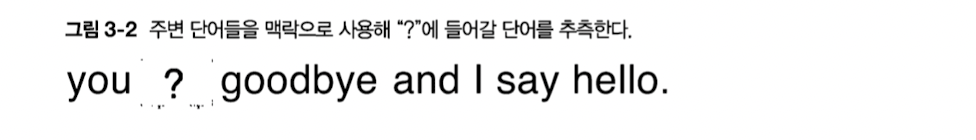

In [3]:
from IPython.display import Image
Image("/Users/choeunsol/Python/주피터 이미지용 사진/ch3_2.png")

위 그림처럼 추론 문제를 풀고 학습하는 것이 추론 기반 기법이 다루는 문제이다. 이러한 추론 문제를 반복해서 풀면서 단어의 출현 패턴을 학습하는 것이다. 모델 관점에서 보면 이 추론 문제는 다음과 같이 보인다.

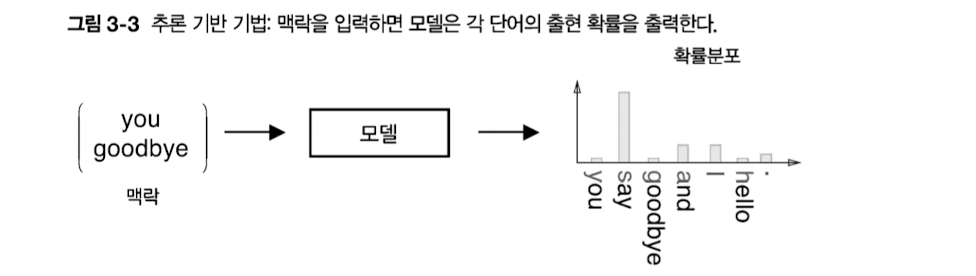

In [4]:
Image("/Users/choeunsol/Python/주피터 이미지용 사진/ch3_3.png")

모델은 맥락 정보를 입력받아 **각 단어의 출현 확률을 출력**한다. 이러한 틀 안에서 말뭉치를 사용해 모델이 올바른 추측을 내놓도록 학습시킨다. 그리고 그 학습의 결과로 단어의 분산 표현을 얻는 것이 추론 기반 기법의 전체 그림이다.

<font color = purple> 단어의 분산 표현은 **단어의 의미를 정확하게 표현할 수 있는 벡터 표현**이다. </font>

<font color = blue> NOTE. 추론 기반 기법도 통계 기반 기법처럼 본포 가설에 기초한다. 분포 가설이란 단어의 의미는 주변 단어에 의해 형성된다는 가설로, 추론 기반 기법에서는 이를 앞에서와 같은 추측 문제로 귀결시켰다. 이처럼 두 기법 모두 분포 가설에 근거하는 '단어의 동시발생 가능성'을 얼마나 잘 모델링하는가가 중요한 연구 주제이다. </font>

### 신경망에서의 단어 처리

지금부터 신경망을 이용해 단어를 처리한다. 그런데 신경망은 "you"와 "say" 등의 단어를 있는 그대로 처리할 수 없으니 단어를 **고정 길이의 벡터**로 변환해야 한다. 이때 사용하는 대표적인 방법이 단어를 **원핫 표현(또는 원핫 벡터)** 으로 변환하는 것이다. 원핫 표현이란 벡터의 원소 중 하나만 1이고 나머지는 모두 0인 벡터를 말한다.

원핫 표현에 대해 구체적으로 살펴보자. 여기에서는 앞 장과 같이 "You say goodbye and I say hello."라는 한 문장짜리 말뭉치를 예로 설명하겠다. 이 말뭉치에는 어휘가 총 7개가 등장한다("you", "say", "goodbye", "and", "i", "hello", "."). 이중 두 단어의 원핫 표현을 아래 그림에 나타냈다.

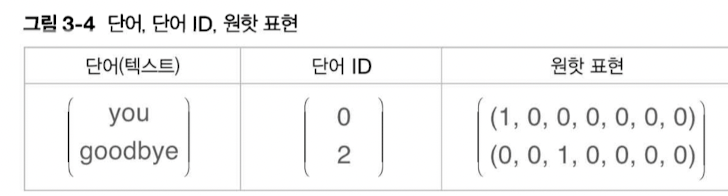

In [6]:
Image("/Users/choeunsol/Python/주피터 이미지용 사진/ch3_4.png")

위 그림처럼 단어는 텍스트, 단어 ID, 그리고 원핫 표현 형태로 나타낼 수 있다.

여기서 단어를 원핫 표현으로 변환하는 방법은 이렇다. 먼저 총 어휘 수만큼의 원소를 갖는 벡터를 준비하고, 인덱스가 단어 ID와 같은 원소를 1로, 나머지는 모두 0으로 설정한다. 이처럼 단어를 고정 길이 벡터로 변환하면 우리 신경망의 입력층은 뉴런의 수를 고정할 수 있다.

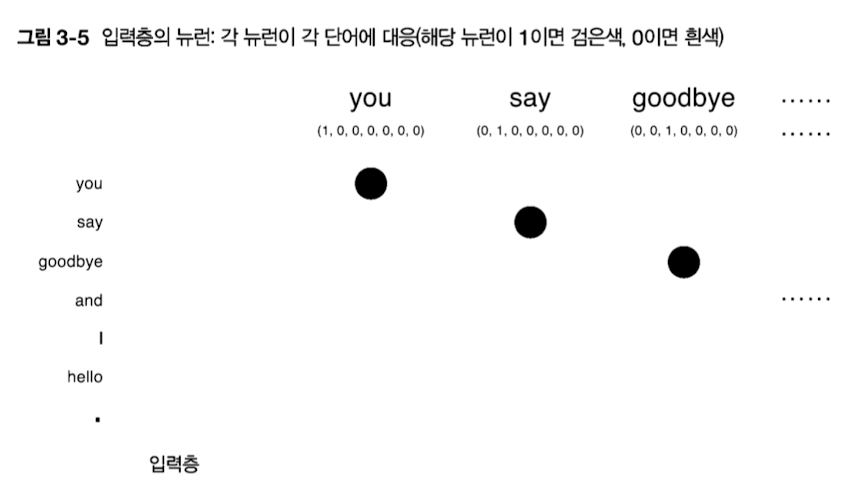

In [7]:
Image("/Users/choeunsol/Python/주피터 이미지용 사진/ch3_5.png")

위 그림처럼 입력층의 뉴런은 총 7개이다. 이 7개의 뉴런은 차례로 7개의 단어들에 대응한다(첫 번째 뉴런은 "you"에, 두 번째 뉴런은 "say"에...).

단어를 벡터로 나타낼 수 있고, 신경망을 구성하는 '계층'들은 벡터를 처리할 수 있다. 다시 말해, 신경망으로 처리할 수 있다는 뜻이다. 예컨대 아래 그림은 원핫 표현으로 된 단어 하나를 완전연결계층을 통해 변환하는 모습을 보여준다.

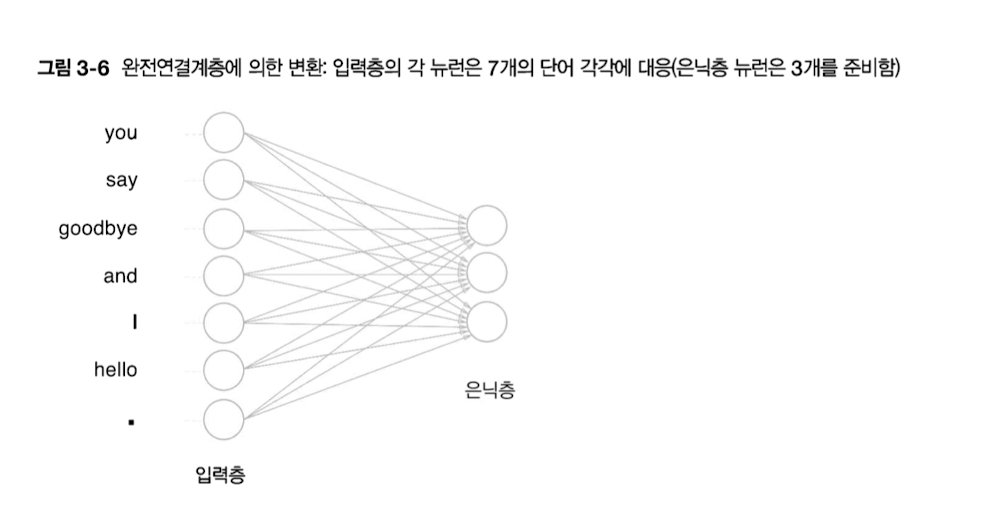

In [8]:
Image("/Users/choeunsol/Python/주피터 이미지용 사진/ch3_6.png")

위 그림의 신경망은 완전연결계층이므로 **각각의 노드가 이웃 층의 모든 노드와 화살표로 연결**되어 있다. 이 화살표에는 가중치(매개변수)가 존재하여, 입력층 뉴런과의 가중합(weighted sum)이 은닉층 뉴런이 된다. 이번 장에서 사용하는 완전연결계층에서는 편향을 생략했다.

<font color = red> WARNING_ 편향을 이용하지 않는 완전연결계층은 '행렬 곱' 계산에 해당한다. 그래서 이 책의 경우, 완전연결계층은 1장에서 구현한 MatMul 계층과 같아진다. 딥러닝 프레임워크들은 일반적으로 완전연결계층을 생성할 때 편향을 이용할지 선택할 수 있도록 한다. </font>

[그림 3-6]에서는 뉴런 사이의 결합을 화살표로 그렸지만, 이후로는 가중치를 명확하게 보여주기 위해 [그림 3-7]처럼 그리겠다.

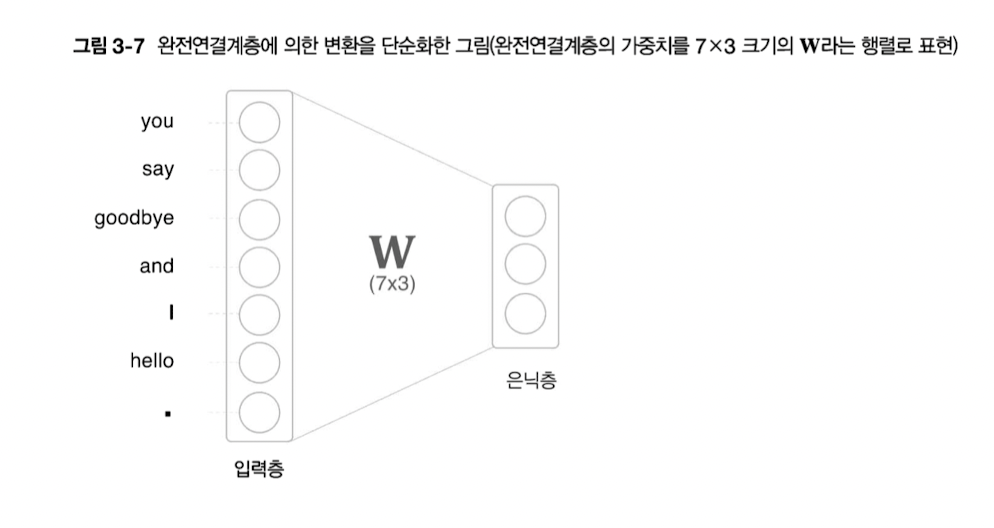

In [11]:
Image("/Users/choeunsol/Python/주피터 이미지용 사진/ch3_7.png")

그렇다면 여기까지의 이야기를 코드로 살펴보자. 지금의 완전연경계층에 의한 변환은 파이썬으로는 다음과 같이 작성할 수 있다.

In [12]:
import numpy as np

c = np.array([[1,0,0,0,0,0,0]]) # 입력
W = np.random.randn(7, 3)
h = np.matmul(c, W) # 중간 노드
print(h)

[[ 0.94990474 -0.4167405  -2.05132768]]


    단어 ID가 0인 단어들을 원핫 표현으로 표현한 다음 완전연결계층을 통과시켜 변환하는 모습을 보여준다.
    
    완전연결계층의 계산은 행렬 곱으로 수행할 수 있고, 행렬 곱은 넘파이의 np.matmul()이 해결해준다.

<font color = red> WARNING_ 이 코드에서 입력 데이터의 차원 수는 2이다. 이는 미니배치 처리를 고려한 것으로, 최초의 차원(0번째 차원)에 각 데이터를 저장한다. </font>

앞의 코드에서 주목할 부분으 $c$와 $W$의 행렬 곱 부분이다. c는 원핫 표현이므로 **단어 ID에 대응하는 원소만 1이고 그 외에는 0인 벡터**이다. 따라서 앞 코드의 $c$와 $W$의 행렬 곱은 결국 **가중치의 행 벡터 하나**를 뽑아낸 것과 같다.

그저 가중치로부터 행벡터를 뽑아낼 뿐인데 행렬 곱을 계산하는 건 분명히 비효율적이다. 이 점은 다음 장에서 개선할 예정이다

또한, 앞의 코드로 수행한 작업은 MatMul 계층으로도 수행할 수 있다.

In [3]:
import sys, os
import numpy as np
os.getcwd()

'/Users/choeunsol/Python/deep_learning_from_scratch/deep-learning-from-scratch-2-master/ch03'

In [4]:
os.chdir("/Users/choeunsol/Python/deep_learning_from_scratch/deep-learning-from-scratch-2-master/ch03")
sys.path.append(os.pardir)
from common.layers import MatMul

c = np.array([[1, 0, 0, 0, 0, 0, 0]])
W = np.random.randn(7,3)
layer = MatMul(W)
h = layer.forward(c)
print(h)

[[ 1.10911661 -0.05084169  0.4650308 ]]


    common 디렉터리에 있는 MatMul 계층을 임포트하여 사용한다.
    
    그런 다음 MatMul 계층에 가중치 W을 설정하고 forward() 메서드를 호출해 순전파를 수행한다.

## 단순한 word2vec

앞 절에서는 추론 기반 기법을 배우고, 신경망으로 단어를 처리하는 방법을 코드로 살펴보았다. 이제는 word2vec을 구현해보자.

지금부터 할 일은 **모델을 신경망으로 구축하는 것**이다. 그리고 이번 절에서 사용할 신경망은 word2vec에서 제안하는 **CBOW 모델**이다.

<font color = red> WARNING_ word2vec이라는 용어는 원래 프로그램이나 도구를 가리키는 데 사용됐다. 이 용어가 유명해지면서, 문맥에 따라서는 신경망 모델을 가리키는 경우도 많이 볼 수 있다. CBOW 모델과 skip-gram 모델은 word2vec에서 사용되는 신경망이다. 이번 절에서는 CBOW 모델을 중심으로 이야기를 풀어가며, 두 모델의 차이는 '3.5.2  skip-gram 모델'에서 자세히 설명하겠다. </font>

### CBOW 모델의 추론 처리

CBOW 모델은 맥락으로부터 타깃을 추측하는 용도의 신경망이다(타깃은 중앙 단어이고 그 주변 단어들이 맥락이다). 우리는 이 CBOW 모델이 가능한 한 정확하게 추론하도록 훈련시켜서 단어의 분산 표현을 얻어낼 것이다.

CBOW 모델의 입력은 **맥락**이다. 맥락은 "you"와 "goodbye"와 같은 단어들의 목록이다.

가장 먼저, 이 맥락을 원핫 표현으로 변환하여 CBOW 모델을 처리할 수 있도록 준비한다. 이상을 기초로 CBOW 모델의 신경망을 다음과 같이 그릴 수 있다.

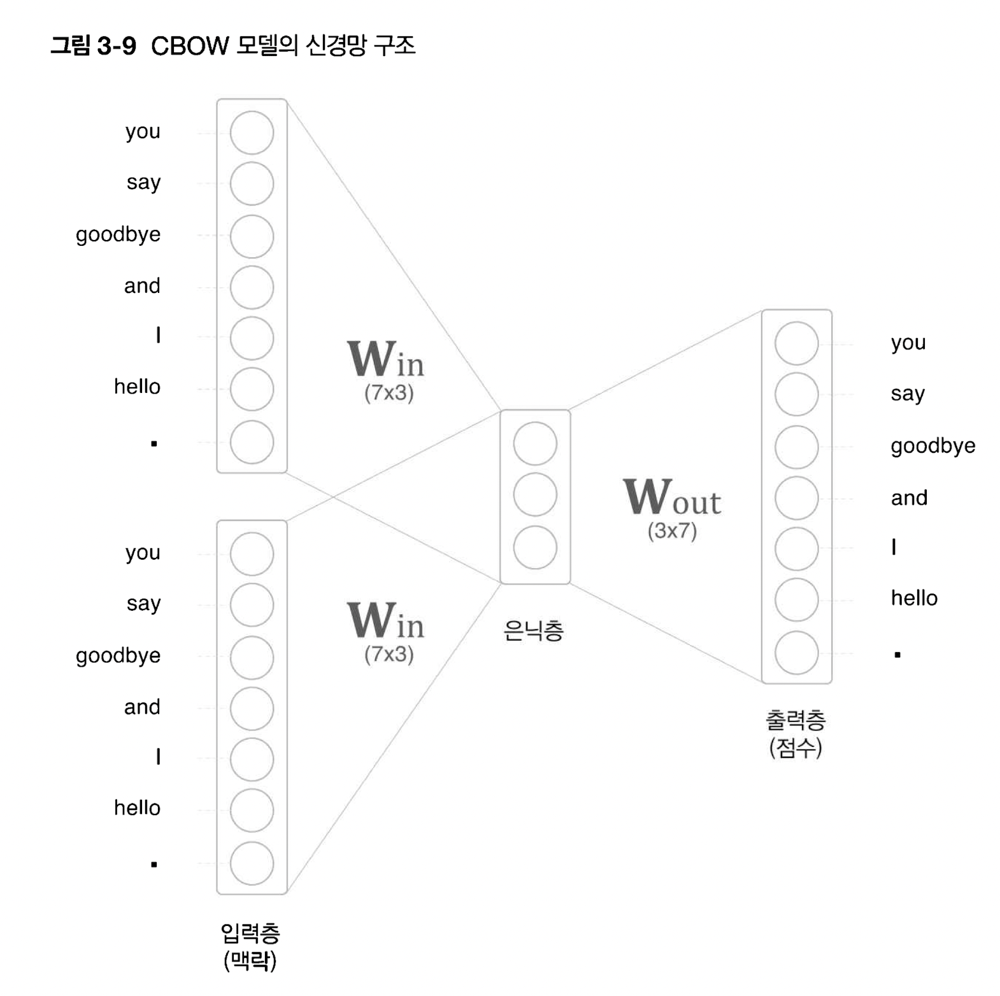

In [15]:
Image("/Users/choeunsol/Python/주피터 이미지용 사진/ch3_9.png")

위 그림이 CBOW 모델의 신경망이다.

입력층이 2개 있고, 은닉층을 거쳐 출력층에 도달한다. 두 입력층에서 은닉층으로의 변환은 똑같은 완전연결계층(가중치는 $\boldsymbol W_{in}$)이 처리한다. 그리고 은닉층에서 출력층 뉴런으로의 변환은 다른 완전연결계층(가중치는 $\boldsymbol W_{out}$이 처리한다.

<font color = red> WARNING_ 이 그림에서 입력층이 2개인 이유는 **맥락으로 고려할 단어를 2개로 정했기 때문**이다. 즉, 맥락에 포함시킬 단어가 N개라면 입력층도 N개가 된다. </font>

그렇다면 위 모델의 은닉층에 주목하자. 은닉층의 뉴런은 입력층의 완전연결계층에 의해 변환된 값이 되는데, 입력층이 여러 개이면 **전체를 평균**하면 된다. 앞의 예에 대입해보면 다음과 같다.

완전연결계층에 의한 첫 번째 압력층이 $\boldsymbol h_1$으로 변환되고, 두 번째 입력층이 $\boldsymbol h_2$로 변환되었다고 하면, **은닉층 뉴런은 $\frac{1}{2} (\boldsymbol {h_1 + h_2})$** 가 되는 것이다.

마지막으로 출력층을 보자. 출력층의 뉴런은 총 7개인데, 여기서 중요한 것은 **이 뉴런 하나하나가 각각의 단어에 대응한다는 점**이다. 그리고 출력층 뉴런은 **각 단어의 점수를 뜻**하며, **값이 높으룻록 대응 단어의 출현 확률도 높아진다**. 여기서 점수란 확률로 해석되기 전의 값이고, 이 점수에 **소프트맥스 함수를 적용해서 확률을 얻을 수 있다**.

<font color = red> WARNING_ 점수를 Softmax 계층에 통과시킨 후의 뉴런을 출력층이라고도 한다. 이 책에서는 점수를 출력하는 노드를 출력층이라고 하겠다. </font>

입력층에서 은닉층으로의 변환은 완전연결계층(가중치는 $\boldsymbol W_m$)에 의해서 이뤄진다. 이 때 완전연결계층의 가중치 $\boldsymbol W_m$은 7 x 3 행렬이며, **이 가중치가 단어의 분산 표현의 정체**이다.

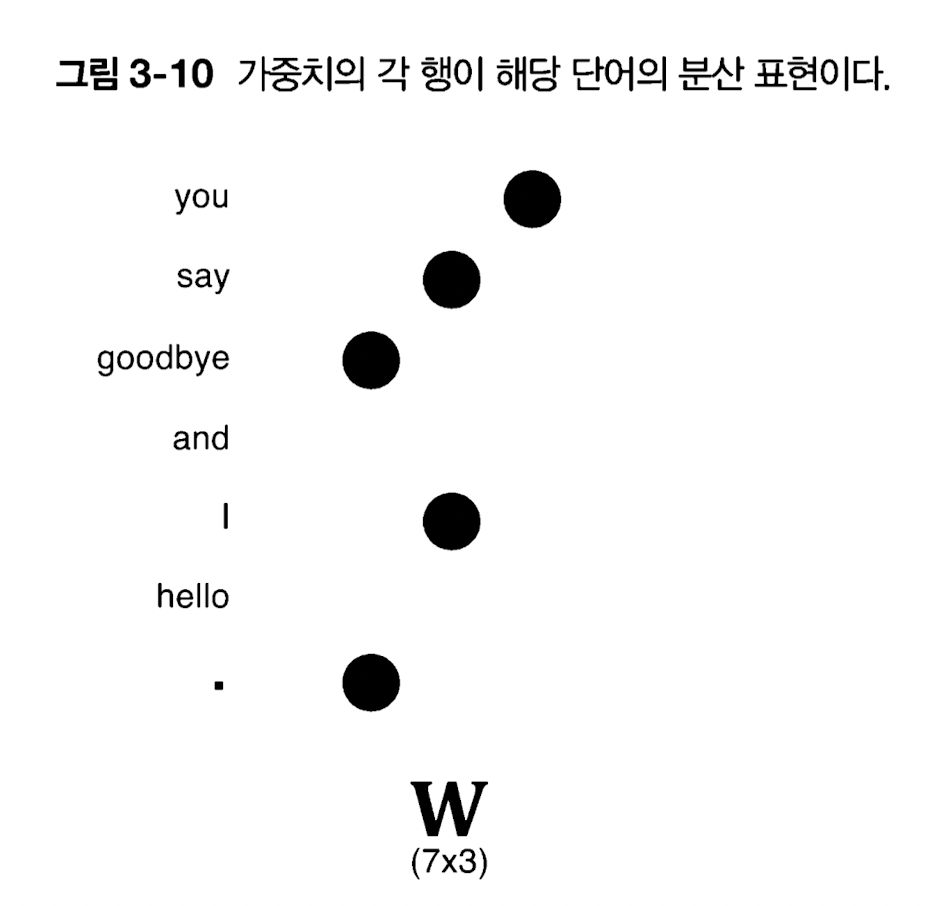

In [16]:
Image("/Users/choeunsol/Python/주피터 이미지용 사진/ch3_10.png")

위에서 보듯 가중치 $\boldsymbol W_m$의 각 행에는 해당 단어의 분산 표현이 담겨 있다고 볼 수 있다.

따라서 학습을 진행할수록 **맥락에서 출현하는 단어를 잘 추측하는 방향으로 이 분산 표현이 갱신**될 것이다. 이렇게 해서 얻은 벡터에는 단어의 의미도 잘 녹아들어 있다. 이것이 word2vec의 전체 그림이다.

<font color = blue> 은닉층의 뉴런 수를 입력층의 뉴런 수보다 적게 하는 것이 중요한 핵심이다. 이렇게 해야 은닉층에는 단어 예측에 필요한 정보를 간결하게 담게 되며, 결과적으로 밀집벡터 표현을 얻을 수 있다. 이때 그 은닉층의 정보는 우리 인간은 이해할 수 없는 코드로 쓰여 있다. 바로 '인코딩'에 해당된다. 한편, 은닉층의 정보로부터 원하는 결고라르 얻는 작업은 '디코딩'이라고 한다. 즉, 디코딩이란 인코딩된 정보를 우리 인간이 이해할 수 있는 표현으로 복원하는 작업이다. </font>

지금까지 우리는 CBOW 모델을 뉴런 관점에 그려왔다. 그래서 이번에는 계층 관점에서 그려볼 것이다.

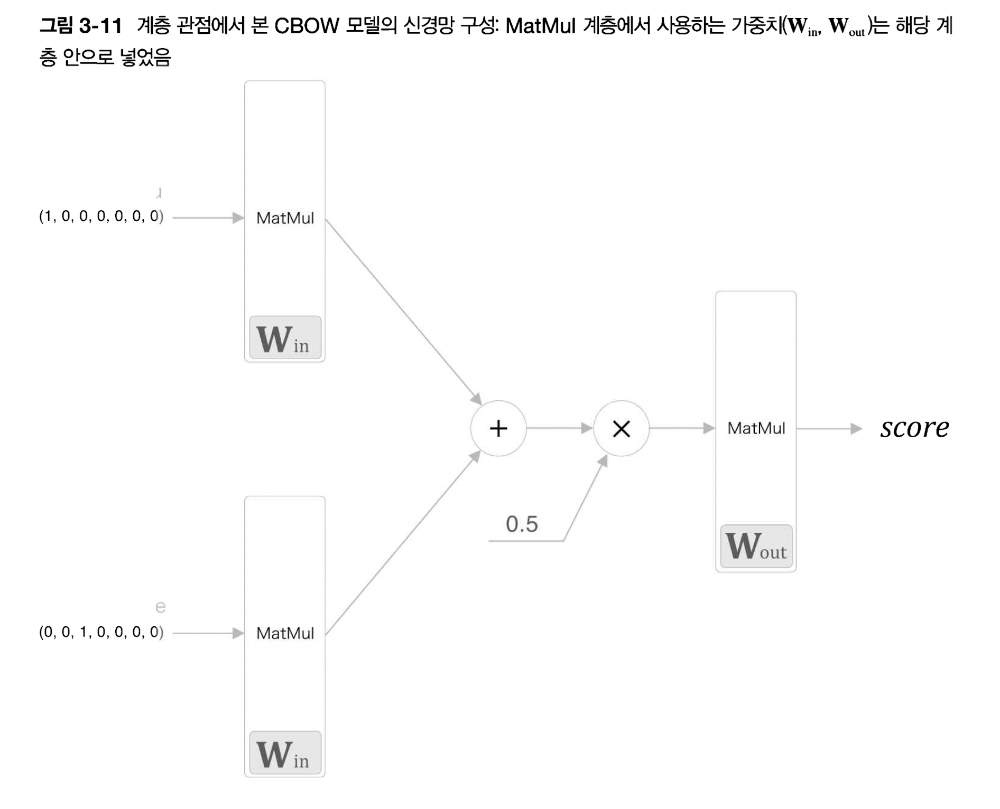

In [18]:
Image("/Users/choeunsol/Python/주피터 이미지용 사진/ch3_11.png")

위 그림에서 알 수 있듯이, CBOW 모델 가장 앞단에는 2개의 MatMul 계층이 있고, 이어서 이 두 계층의 출력이 더해진다.

그리고 더해진 값에 0.5를 곱하면 평균이 되며, 이 평균이 은닉층 뉴런이 된다. 마지막으로 은닉층 뉴런에 또 다른 MatMul 계층이 적용되어 점수(score)가 출력된다.

<font color = red> WARNING_ 편향을 사용하지 않는 완전연결계층의 처리는 MatMul 계층의 순전파와 같다. MatMul 계층은 내부에서 행렬 곱을 계산한다. </font>

그렇다면 위 그림을 참고하여, CBOW 모델의 추론 처리를 Python으로 구현해보자. 추론 처리는 **점수를 구하는 처리**를 말한다. 이는 다음과 같이 구현할 수 있다.

    이 코드에서는 가장 먼저 필요한 가중치들(W_in과 W_out)을 초기화한다.
    
    그리고 입력층을 처리하는 MatMul 계층을 맥락 수만큼 (여기에서는 2개) 생성하고, 출력층 측의 MatMul 계층은 1개만 생성한다. 이때 입력층 측의 MatMul 계층은 가중치 W_in을 공유한다.
    
    다음은 입력층 측의 MatMul 계층들(in_layer0과 in_layer1)의 forward() 메서드를 호출해 중간 데이터를 계산하고, 출력층 측의 MatMul 계층(out_layer)를 통과시켜 각 단어의 점수를 구한다.
    
이상이 CBOW 모델의 추론 과정이다. 여기서 보았듯이 CBOW 모델은 **활성화 함수를 사용하지 않는 간단한 구성의 신경망**이다. 입력층이 여러 개 있고 그 입력층들이 가중치를 공유한다는 점을 제외하면 앞에서 본 신경망과 다른 점은 없다.

### CBOW 모델의 학습

지금까지 설명한 CBOW 모델은 출력층에서 각 단어의 점수를 출력했다. 이 점수에 **소프트맥스 함수를 적용**하면 확률을 얻을 수 있다. 이 확률은 **맥락이 주어졌었을 때 그 중앙에 어떤 단어가 출현하는지**를 나타낸다.

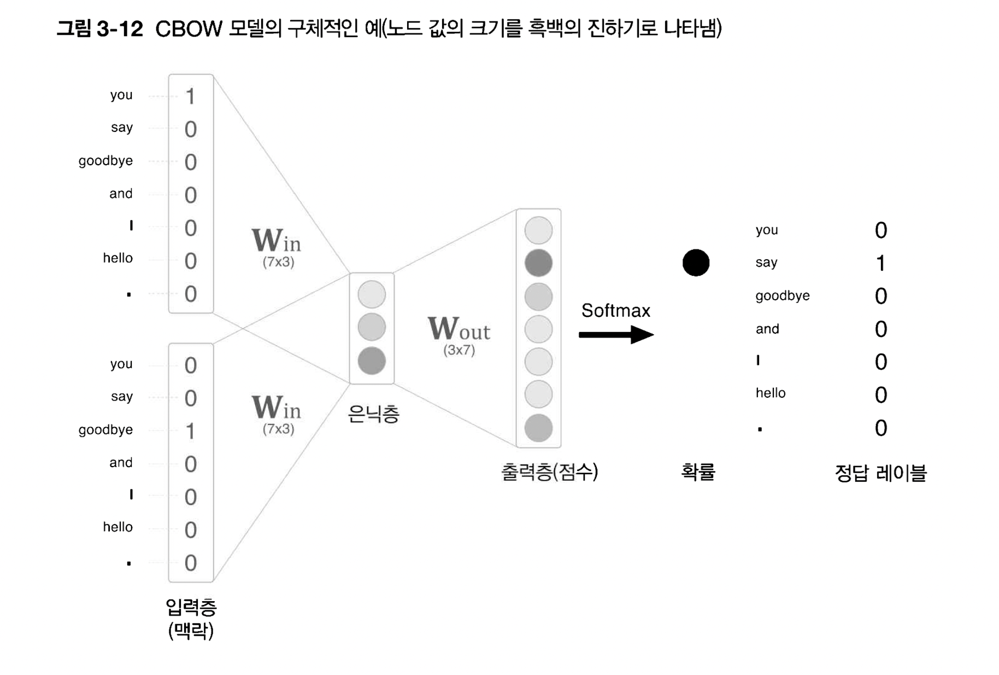

In [20]:
Image("/Users/choeunsol/Python/주피터 이미지용 사진/ch3_12.png")

위 그림이 예에서 **맥락은 "you"와 "goodbye"** 이고, 정답 레이블(신경망이 예측해야 할 단어)은 "say"이다.

이 때 **가중치가 적절히 설정된 신경망**이라면 확률을 나타내는 뉴런들 중 정답에 해당하는 뉴런의 값이 클 것이라 기대할 수 있다.

CBOW 모델의 학습에서는 올바른 예측을 할 수 있도록 가중치를 조정하는 일을 한다. 그 결과로 가중치 $\boldsymbol W_{in}$에 (정확하게는 $\boldsymbol W_{in}$과 $\boldsymbol W_{out}$ 모두에) 단어의 출현 패턴을 파악한 벡터가 학습된다.

그리고 지금까지의 실험에 의해 CBOW 모델(과 skip-gram 모델)로 얻을 수 있는 단어의 분산 표현은 단어의 의미 면이나 문법 면에서 모두 우리의 직관에 부합하는 경우를 많이 볼 수 있다(대규모 말뭉치를 사용해 얻을 수 있는 단어의 분산 표현이라면 더욱 그렇다).

<font color = blue> NOTE. CBOW 모델은 단어 출현 패턴을 학습 시 사용한 말뭉치로부터 배운다. 따라서 말뭉치가 다르면 학습 후 얻게 되는 단어의 분산 표현도 달라진다. 예컨대 말뭉치로 스포츠 기사만을 사용하는 경우와 음악 관련 기사만을 사용하는 경우는 얻게 되는 단어의 분산 표현이 크게 다를 것이다. </font>

다시 앞에서 본 신경망의 학습에 대해 생각해보자. 지금부터의 이야기는 간단하다. 우리가 다루고 있는 모델은 **다중 클래스 분류를 수행하는 신경망**이다. 따라서 이 신경망을 학습하려면 소프트맥스와 교차 엔트로피 오차만 이용하면 된다. 여기에서는 **소프트맥스 함수를 이용해 점수를 확률로 변환하고, 그 확률과 정답 레이블로부터 교차 엔트로핖 오차를 구한 후, 그 값을 손실로 사용해 학습을 진행**한다.

그림으로는 다음과 같다.

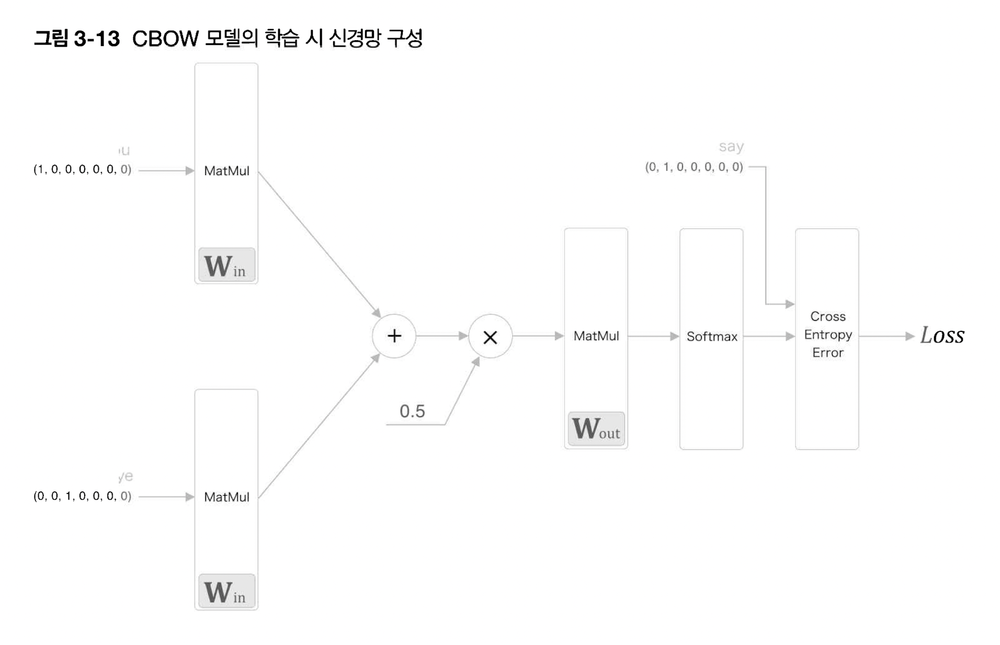

In [21]:
Image("/Users/choeunsol/Python/주피터 이미지용 사진/ch3_13.png")

앞 절에서 설명한 추론 처리를 수행하는 CBOW 모델에 Softmax 계층과 Cross Entropy Error 계층을 추가했을 뿐이다. 이것만으로 손실을 얻을 수 잇다.

이상이 CBOW 모델의 손실을 구하는 계산의 흐름이자, 이 신경망의 순방향 전파이다.

덧붙여 위 그림에서는 Softmax 계층과 Cross Entropy Error 계층을 사용했지만, 우리는 이 두 계층을 Softmax with Loss라는 하나의 계층으로 구현할 것이다.

### word2vec의 가중치와 분산 표현

지금까지 설명한 것처럼 word2vec에 사용되는 신경망에는 두 가지 가중치가 있다. 바로 입력 측 완전연결계층의 가중치($\boldsymbol W_{in}$)와 출력 측 완전연결계층의 가중치 ($\boldsymbol W_{out}$)이다. 그리고 **입력 측 가중치 $\boldsymbol W_{in}$의 각 행이 각 단어의 분산 표현에 해당**한다. 또한 출력 측 가중치 $\boldsymbol W_{out}$에도 단어의 의미가 인코딩된 벡터가 저장되고 있다고 생각할 수 있다.

다만, 출력 측 가중치는 각 단어의 분산 표현이 **열 방향(수직 방향)** 으로 저장된다.

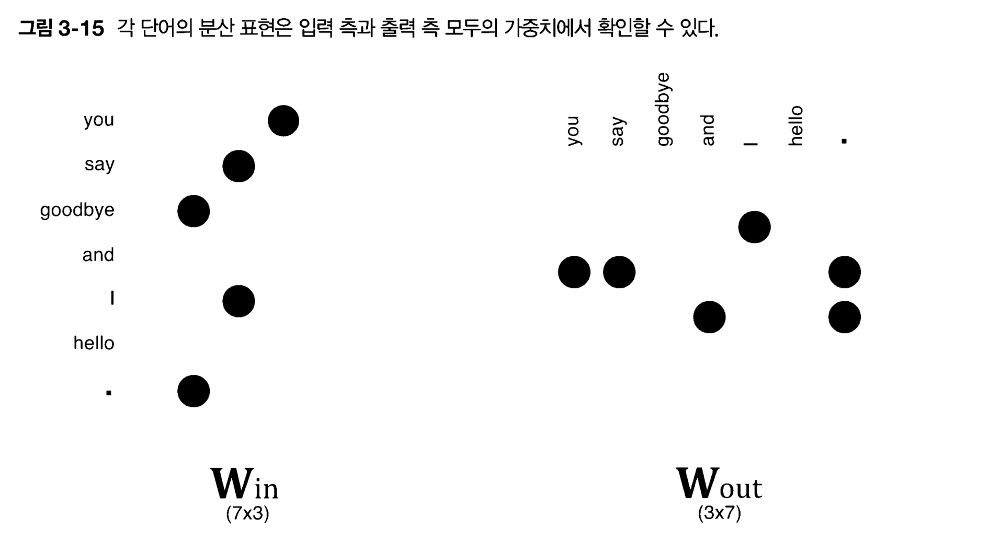

In [22]:
Image("/Users/choeunsol/Python/주피터 이미지용 사진/ch3_15.png")

그러면 최종적으로 이용하는 단어의 분산 표현으로는 어느 쪽 가중치를 선택하면 좋을까? 선택지는 세 가지이다.

- A. 입력 측 가중치만 이용한다.
- B. 출력 측 가중치만 이용한다.
- C. 양쪽 가중치를 모두 이용한다.

A와 B 안은 어느 한쪽 가중치만 이용한다는 것이다. 마지막 C 안에서는 두 가중치를 어떻게 조합하느냐에 따라 다시 몇 가지 방법을 생각해낼 수 있다. 그중 하나는 두 가중치를 단순히 합치는 것이다.

word2vec(특히 skip-grma 모델)에서는 A 안인 '입력 측의 가중치만 이용한다'가 가장 대중적인 선택이다. 많은 연구에서 출력 층 가중치는 $\boldsymbol W_{in}$만을 최종 단어의 분산 표현으로서 이용한다. 우리도 이를 따라서 $\boldsymbol W_{in}$을 단어의 분산 표현으로 이용할 것이다.

<font color = blue> NOTE. word2vec의 skip-gram 모델을 대상으로 $\boldsymbol W_{in}$의 효과를 실험을 통해 보여준다. 한편, word2vec과 비슷한 기법인 GloVe에서는 두 가중치를 더했을 때 좋은 결과를 얻었다. </font>

## 학습 데이터 준비

지금부터 word2vec 학습에 쓰일 학습 데아터를 준비할 것이다. 이번에도 간단한 예로서 지금까지처럼 "You say goodbye and I say hello."라는 한 문장짜리 말뭉치를 이용한다.

### 맥락과 타깃

word2vec에서 이용하는 신경망의 입력은 **맥락**이다. 그리고 그 정답 레이블은 맥락에 둘러싸인 중앙의 단어, 즉 '타깃'이다.

다시 말해, 우리가 해야 할 일은 신경망에 '맥락'을 입력했을 때 '타깃'이 출현할 확률을 높이는 것이다.

그렇다면 말뭉치에서 맥락과 타깃을 만드는 작업을 생각해보자.

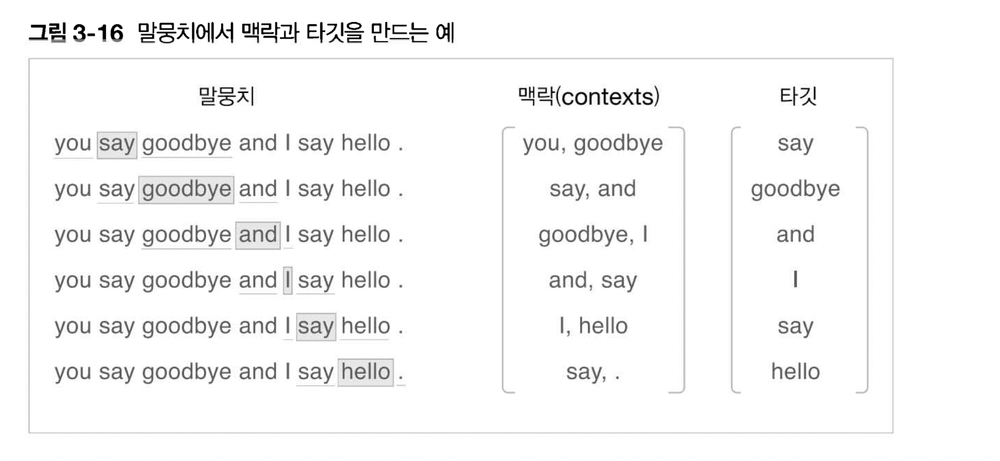

In [23]:
Image("/Users/choeunsol/Python/주피터 이미지용 사진/ch3_16.png")

[그림 3-16]에서는 말뭉치로부터 목표로 하는 단어를 '타깃'으로, 그 주변 단어를 '맥락'으로 뽑아냈다.

이 작업을 말뭉치 안의 (양끝 단어를 제외한) 모든 단어에 대해 수행한다. 이렇게 만들어진 것이 위 그림의 맥락과 타깃이다. 이 맥락의 **각 행이 신경망의 입력**으로 쓰이고, 타깃의 각 행이 **정답 레이블(예측해야 하는 단어)** 이 된다.

참고로, 각 샘플 데이터에서 맥락의 수는 여러 개(이 예에서는 2개)가 될 수 있으나, 타깃은 오직 하나 뿐이다.

그래서 맥락을 영어로 쓸 때는 끝에 's'를 붙여 복수형임을 명시하는 게 좋다.

곧이어 말뭉치로부터 **맥락과 타깃을 만드는 함수를 구현**할 텐데, 그전에 앞 장의 냉요을 살짝 복습해보자.

우선 말뭉치 텍스트를 단어 ID로 변환해야 한다. 이 작업에는 2장에는 구현한 preprocess() 함수를 사용한다.

In [24]:
os.getcwd()

'/Users/choeunsol/Python/deep_learning_from_scratch/deep-learning-from-scratch-2-master/ch03'

In [31]:
## Review : preprocess() 만들기

def preprocess(text):
    text = text.lower()
    text = text.replace('.', ' .')
    words = text.split(' ')
    word_to_id = {}
    id_to_word = {}
    for word in words:
        if word not in word_to_id:
            word_id = len(word_to_id)
            word_to_id[word] = word_id
            id_to_word[word_id] = word
    
    corpus = np.array([word_to_id[w] for w in words])
    
    return corpus, word_to_id, id_to_word

from common.util import preprocess
text = 'You say goodbye and I say hello.'
corpus, word_to_id, id_to_word = preprocess(text)
print(corpus)

[0 1 2 3 4 1 5 6]


그런 다음 단어 ID의 배열은 corpus로부터 맥락과 타깃을 만들어낸다.

구체적으로는 [그림 3-17]처럼 **corpus을 주면 맥락과 타깃을 반환하는 함수를 작성** 한다.

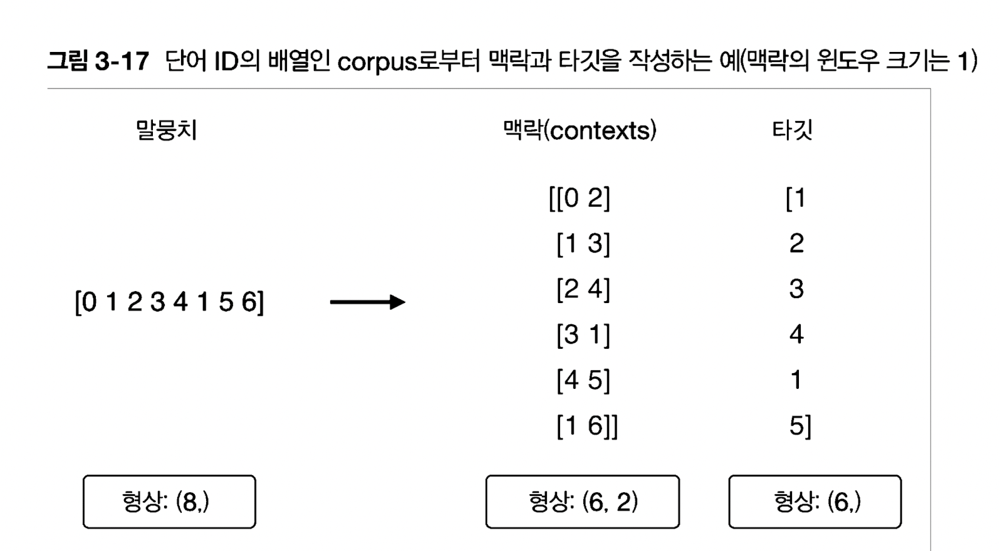

In [28]:
Image("/Users/choeunsol/Python/주피터 이미지용 사진/ch3_17.png")

위와 같이 맥락은 2차원 배열이다. 이때 맥락의 0번째 차원에는 각 맥락 데이터가 저장된다.

정확하게 말하면, contexts[0]에는 0번째 맥락이 저장되고, contexts[1]에는 1번째 맥락이 저장되는 식이다.

마찬가지로 target[0]에는 0번째 타깃이, target[1]에는 1번째 타깃이 저장된다.

In [34]:
def create_context_target(corpus, window_size = 1):
    target = corpus[window_size : -window_size]
    contexts = []
    for idx in range(window_size, len(corpus) - window_size):
        cs = []
        for j in range(-window_size, window_size):
            if j == 0:
                continue # 아래 코드를 실행시키지 않는다.
            cs.append(corpus[idx + j])
        contexts.append(cs)
    
    return np.array(contexts), np.array(target)

contexts, target = create_context_target(corpus, window_size = 1)

print('context', contexts)
print('-' * 50)
print('target', target)

context [[0]
 [1]
 [2]
 [3]
 [4]
 [1]]
--------------------------------------------------
target [1 2 3 4 1 5]


이것으로 말뭉치로부터 맥락과 타깃을 만들어냈다. 나중에 이를 CBOW 모델에 넘겨주면 된다.

그런데 이 맥락과 타깃의 각 원소는 여전히 단어 ID이다. 그럼 이어서 이를 원핫 표현으로 변환하겠다.

### 원핫 표현으로 변환

계속해서 맥락과 타깃을 원핫 표현으로 바꿔보자. 이때 수행하는 변환은 다음과 같다.

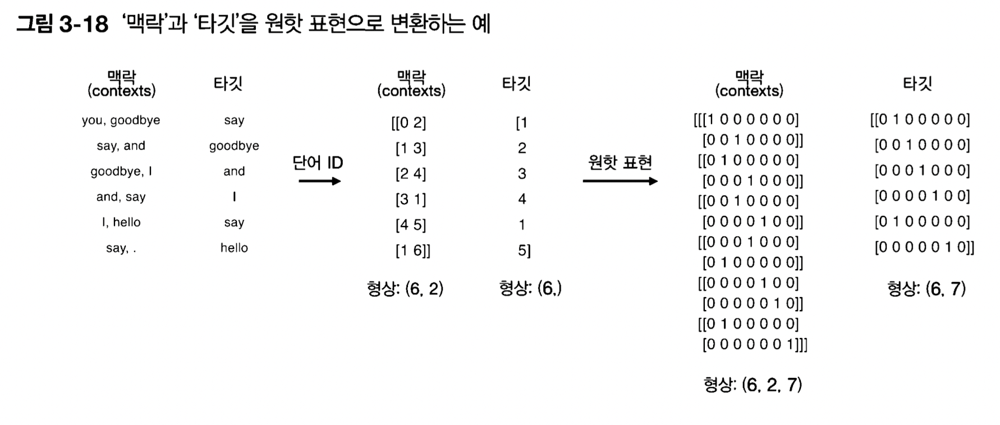

In [36]:
Image("/Users/choeunsol/Python/주피터 이미지용 사진/ch3_18.png")

위의 예처럼 맥락과 타깃을 단어 ID에서 원핫 표현으로 변환하면 된다. 이때 다시 한 번 **다차원 배열의 형상**에 주목해서 보자. 이 그림에서는 단어 ID를 이용했을 때의 맥락의 형상은 $(6,2)$인데, 이를 원핫 표현으로 변환되면 $(6,2,7)$이 된다.

원핫 포현으로의 변환은 이 책이 제공하는 convert_one_hot() 함수를 사용한다. 이 함수의 표현은 아주 간단하며, common/util.py에 구현되어 있다.

In [38]:
def convert_one_hot(corpus, vocab_size):
    ## 원핫 표현으로 변환

    # param corpus: 단어 ID 목록(1차원 또는 2차원 넘파이 배열)
    # param vocab_size: 어휘 수
    # return: 원핫 표현(2차원 또는 3차원 넘파이 배열)
    
    N = corpus.shape[0]

    if corpus.ndim == 1:
        one_hot = np.zeros((N, vocab_size), dtype=np.int32)
        for idx, word_id in enumerate(corpus):
            one_hot[idx, word_id] = 1

    elif corpus.ndim == 2:
        C = corpus.shape[1]
        one_hot = np.zeros((N, C, vocab_size), dtype=np.int32)
        for idx_0, word_ids in enumerate(corpus):
        ## idx_0은 index, word_ids는 인덱스 안의 행렬이다. 첫 번째 벡터 [0,2]는 idx_0은 1, word_ids는 [0,2]이다.
            for idx_1, word_id in enumerate(word_ids):
        ## idx_1은 index, word_id는 벡터의 값이다. 앞에서 for문으로 분리했으므로 인덱스는 각 벡터에 따라 각자 개선된다.
        ## 예를 들어, 첫 번째 벡터 [0,2]의 idx_1은 0, 1로 표현되고, word_id는 0, 2가 된다.
        ## 두 번째 벡터 [1,3]의 idx_1은 0,1(앞의 [0,2]와는 다른 벡터임에 유의), word_id는 1, 3이 된다.
                one_hot[idx_0, idx_1, word_id] = 1

    return one_hot

그렇다면 지금까지의 데이터 준비 과정을 한 데 모아 정리해보자.

In [40]:
from common.util import preprocess, create_contexts_target, convert_one_hot

text = 'You say goodbye and I say hello.'
corpus, word_to_id, id_to_word = preprocess(text)

contexts, target = create_contexts_target(corpus, window_size = 1)

vocab_size = len(word_to_id)
target = convert_one_hot(target, vocab_size)
contexts = convert_one_hot(contexts, vocab_size)

이것으로 학습 데이터 준비를 마쳤다. 다음은 본론은 CBOW 모델 구현이다.

## CBOW 모델 구현

그렇다면 CBOW 모델을 구현할 것이다. 앞에서 말했던 신경망을 SimpleCBOW라는 이름으로 구현한다(다음 장에서는 이를 개선한 CBOW 클래스를 구현한다). SimpleCBOW 클래스의 초기화 메서드부터 시작해보자.

In [ ]:
from common.layers import MatMul, SoftmaxWithLoss

class SimpleCBOW:
    def __init__(self, vocab_size, hidden_size):
        V, H = vocab_size, hidden_size
        W_in = 0.01 * np.random.randn(V,H).astype('f')
        W_out = 0.01 * np.random.randn(H,V).astype('f')
        
        # 계층 생성
        self.in_layer0 = MatMul(W_in)
        self.in_layer1 = MatMul(W_in)
        self.out_layer = MatMul(W_out)
        self.loss_layer = SoftmaxWithLoss()
        
        # 모든 가중치와 기울기를 리스트에 모은다.
        layers = [self.in_layer0, self.in_layer1, self.out_layer]
        self.params, self.grads = [], []
        for layer in layers:
            self.params += layer.params
            self.grads += layer.grads
            
        # 인스턴스 변수에 단어의 분산 표현을 저장한다.
        self.word_vecs = W_in
        
    # 순전파 메서드 구현
    def forwsrd(self, contexts, target):
        h0 = self.in_layer0.forward(contexts[:, 0])
        h1 = self.in_layer1.forward(contexts[:, 1])
        h = (h0 + h1) * 0.5
        score = self.out_layer.forward(h)
        loss = self.loss_layer.forward(score, target)
        return loss
    
    # 역전파 메서드 구현
    def backward(self, dout = 1):
        ds = self.loss_layer.backward(dout)
        da = self.out_layer.backward(ds)
        da *= 0.5
        self.in_layer1.backward(da)
        self.in_layer0.backward(da)
        return None

#### 초기화 메서드

    초기화 메서드는 인수로 어휘 수(vocab_size)와 은닉층의 뉴런 수(hidden_size)를 받는다.
    
    가중치 초기화 부분에서는 가중치를 2개 생성한다(W_in과 W_out). 이 두 가지는 각각 작은 무작위 값으로 초기화된다.    
    이때 넘파이 배열의 데아터타입을 astype('f')로 지정해 32비트 부동소수점 수로 초기화한다.
    
    이어서 계층을 생성한다.
    입력 층의 MatMul 계층을 2개, 출력 측의 MatMul 계층을 하나, 그리고 Softmax with Loss 계층을 하나 생성한다.
    여기서 입력 측의 맥락을 처리하는 MatMul 계층은 맥락에서 사용하는 단어의 수(윈도우 크기)만큼 만들어야 한다(이 예에서는 2개).
    입력 측 MatMul 계층들은 모두 같은 가중치를 이용하도록 초기화한다.
    
    마지막으로 이 신경망에서 사용되는 매개변수와 기울기를 인스턴스 변수인 params와 grads 리스트에 각각 모아둔다.

<font color = red> WARNING_ 이 코드에서는 여러 계층에서 같은 가중치를 공유하게 된다. 따라서 params 리스트에는 같은 가중치가 여러 개 존재하게 되느데, 이렇게 되면 Adam이나 Momentum 등의 optimizer 처리가 본래의 동작과는 달라져버린다. 그래서 Trainer class 내부에서는 매개변수를 갱신할 때 매개변수의 중복을 없애는 간단한 작업을 수행하도록 했다. 궁금하면 common/trainer.py의 remove_duplicate(params, grads) 함수를 참고하자. </font>

#### 순전파 메서드

    순전파 메서드는 인수로 contexts와 target을 받아 loss(손실)을 반환한다.
    
    contexts는 3차원 넘파이 배열이라 가정하자. 위의 예라면 이 배열의 형상은 (6,2,7)이 된다. [채널, 행, 열 순]
    0번째 차원의 원소 수는 미니배치의 수, 1번째 차원의 원소 수는 맥락의 윈도우 크기, 2번째 차원은 원핫 벡터이다.
    
    target의 형상은 2차원으로, 예컨대 (6,7)과 같은 형상이 된다.
    
#### 역전파 메서드

    신경망의 역전파는 기울기를 순전파와 반대 방향으로 전파한다. 이 역전파는 1에서 시작하여 곧바로 Softmax with Loss 계층에 입력된다. 그리고 Softmax with Loss 계층의 역전파 출력이 ds이며, 이 ds를 출력 측 MatMul 계층으로 입력한다.
    
    그런 다음 'X'와 '+'연산으로 역전파한다.
    'X'의 역전파는 순전파 시의 입력을 서로 바꿔 기울기에 곱한다.
    '+'의 역전파는 기울기를 그대로 통과시킨다.
    
    이미 각 매개변수의 기울기를 인스턴스 변수 grads에 모아놨으므로, forward() 메서드를 호출한 다음 backward() 메서드를 실행하는 것만으로 grads 리스트의 기울기가 갱신된다.

### 학습 코드 구현

CBOW 모델의 학습은 일반적인 신경망의 학습과 완전히 같다. 학습 데이터를 준비해 신경망에 입력한 다음, 기울기를 구하고 가중치 매개변수를 순서대로 갱신할 것이다.

Trainer 클래스를 이용해 학습을 진행할 것이다.

| 에폭 1 |  반복 1 / 2 | 시간 0[s] | 손실 1.95
| 에폭 2 |  반복 1 / 2 | 시간 0[s] | 손실 1.95
| 에폭 3 |  반복 1 / 2 | 시간 0[s] | 손실 1.95
| 에폭 4 |  반복 1 / 2 | 시간 0[s] | 손실 1.95
| 에폭 5 |  반복 1 / 2 | 시간 0[s] | 손실 1.95
| 에폭 6 |  반복 1 / 2 | 시간 0[s] | 손실 1.95
| 에폭 7 |  반복 1 / 2 | 시간 0[s] | 손실 1.95
| 에폭 8 |  반복 1 / 2 | 시간 0[s] | 손실 1.95
| 에폭 9 |  반복 1 / 2 | 시간 0[s] | 손실 1.95
| 에폭 10 |  반복 1 / 2 | 시간 0[s] | 손실 1.95
| 에폭 11 |  반복 1 / 2 | 시간 0[s] | 손실 1.95
| 에폭 12 |  반복 1 / 2 | 시간 0[s] | 손실 1.94
| 에폭 13 |  반복 1 / 2 | 시간 0[s] | 손실 1.94
| 에폭 14 |  반복 1 / 2 | 시간 0[s] | 손실 1.94
| 에폭 15 |  반복 1 / 2 | 시간 0[s] | 손실 1.94
| 에폭 16 |  반복 1 / 2 | 시간 0[s] | 손실 1.94
| 에폭 17 |  반복 1 / 2 | 시간 0[s] | 손실 1.94
| 에폭 18 |  반복 1 / 2 | 시간 0[s] | 손실 1.94
| 에폭 19 |  반복 1 / 2 | 시간 0[s] | 손실 1.94
| 에폭 20 |  반복 1 / 2 | 시간 0[s] | 손실 1.94
| 에폭 21 |  반복 1 / 2 | 시간 0[s] | 손실 1.94
| 에폭 22 |  반복 1 / 2 | 시간 0[s] | 손실 1.94
| 에폭 23 |  반복 1 / 2 | 시간 0[s] | 손실 1.94
| 에폭 24 |  반복 1 / 2 | 시간 0[s] | 손실 1.94
| 에폭 25 |  반복 1 / 2 | 시간 0[s] | 손실 1.94
| 에폭 26 |

| 에폭 738 |  반복 1 / 2 | 시간 0[s] | 손실 0.83
| 에폭 739 |  반복 1 / 2 | 시간 0[s] | 손실 0.46
| 에폭 740 |  반복 1 / 2 | 시간 0[s] | 손실 0.55
| 에폭 741 |  반복 1 / 2 | 시간 0[s] | 손실 0.69
| 에폭 742 |  반복 1 / 2 | 시간 0[s] | 손실 0.42
| 에폭 743 |  반복 1 / 2 | 시간 0[s] | 손실 0.52
| 에폭 744 |  반복 1 / 2 | 시간 0[s] | 손실 0.65
| 에폭 745 |  반복 1 / 2 | 시간 0[s] | 손실 0.62
| 에폭 746 |  반복 1 / 2 | 시간 0[s] | 손실 0.55
| 에폭 747 |  반복 1 / 2 | 시간 0[s] | 손실 0.72
| 에폭 748 |  반복 1 / 2 | 시간 0[s] | 손실 0.62
| 에폭 749 |  반복 1 / 2 | 시간 0[s] | 손실 0.59
| 에폭 750 |  반복 1 / 2 | 시간 0[s] | 손실 0.45
| 에폭 751 |  반복 1 / 2 | 시간 0[s] | 손실 0.48
| 에폭 752 |  반복 1 / 2 | 시간 0[s] | 손실 0.78
| 에폭 753 |  반복 1 / 2 | 시간 0[s] | 손실 0.62
| 에폭 754 |  반복 1 / 2 | 시간 0[s] | 손실 0.35
| 에폭 755 |  반복 1 / 2 | 시간 0[s] | 손실 0.65
| 에폭 756 |  반복 1 / 2 | 시간 0[s] | 손실 0.65
| 에폭 757 |  반복 1 / 2 | 시간 0[s] | 손실 0.65
| 에폭 758 |  반복 1 / 2 | 시간 0[s] | 손실 0.49
| 에폭 759 |  반복 1 / 2 | 시간 0[s] | 손실 0.71
| 에폭 760 |  반복 1 / 2 | 시간 0[s] | 손실 0.65
| 에폭 761 |  반복 1 / 2 | 시간 0[s] | 손실 0.41
| 에폭 762 |  반복 1

/Users/choeunsol/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 48152 (\N{HANGUL SYLLABLE BAN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/choeunsol/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 48373 (\N{HANGUL SYLLABLE BOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/choeunsol/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49552 (\N{HANGUL SYLLABLE SON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/choeunsol/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49892 (\N{HANGUL SYLLABLE SIL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


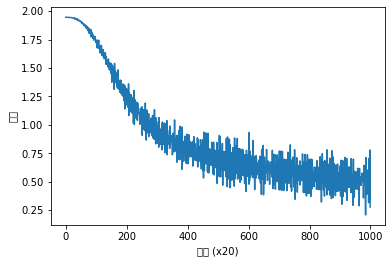

In [7]:
from common.trainer import Trainer
from common.optimizer import Adam
from simple_cbow import SimpleCBOW
from common.util import preprocess, create_contexts_target, convert_one_hot

window_size = 1
hidden_size = 5
batch_size = 3
max_epoch = 1000

text = "You say goodbye and I say hello."
corpus, word_to_id, id_to_word = preprocess(text)

vocab_size = len(word_to_id)
contexts, target = create_contexts_target(corpus, window_size)
target = convert_one_hot(target, vocab_size)
contexts = convert_one_hot(contexts, vocab_size)

model = SimpleCBOW(vocab_size, hidden_size)
optimizer = Adam()
trainer = Trainer(model, optimizer)

trainer.fit(contexts, target, max_epoch, batch_size)
trainer.plot()

    매개변수 갱신 방법으로는 SGD와 AdaGrad 같은 유명 알고리즘 몇 개가 common/optimizer.py에 구현되어 있다. 이 코드에서는 그 중 Adam을 선택했다. 

    Trainer 클래스는 1장에서 설명한 방식으로 신경망을 학습시킨다. 즉, 학습 데이터로부터 미니배치를 선택한 다음, 신경망에 입력해 기울기를 구하고, 그 기울기를 Optimizer에 넘겨 매개변수를 갱신하는 일련의 작업을 수행한다.

<font color = blue> NOTE. 앞으로도 신경망 학습에는 Trainer 클래스를 이용한다. Trainer 클래스를 이용하면 복잡해지기 쉬운 학습 코드를 깔끔하게 유지할 수 있다. </font>

결과를 보면 학습을 거듭할수록 손실이 줄어드는 것을 알 수 있다.

그렇다면 학습이 끝난 후의 가중치 매개변수를 살펴보자. 입력 측 MatMul 계층의 가중치는 인스턴스 변수 word_vecs에 저장되어 있으니, 앞의 코드 바로 뒤에 다음 코드를 추가한다.

In [8]:
word_vecs = model.word_vecs
for word_id, word in id_to_word.items():
    print(word, word_vecs[word_id])

you [-1.5344702 -1.1528556  0.9048294 -1.3046962 -0.8651179]
say [ 1.2413452   0.2462494  -1.2434299   0.01186923  1.2315377 ]
goodbye [-0.20169795 -0.6985867   1.0978606  -0.5062135  -1.1335773 ]
and [ 1.0046201 -1.7611705 -1.0791109 -1.6556801  1.0068107]
i [-0.18885419 -0.6835781   1.0860109  -0.49502274 -1.1007931 ]
hello [-1.5159215 -1.1662624  0.9040847 -1.303395  -0.8668603]
. [ 1.1189901  1.4156109 -1.0328324  1.4097638  1.0838182]


    이 코드는 word_vecs라는 이름으로 가중치를 꺼낸다.
    
    word_vecs의 각 행에는 대응하는 단어 ID의 분산 표현이 저장되어 있다.
    
단어를 밀집 벡터로 나타낸 것이므로, 이 벡터는 **단어의 분산 표현** 이다. 학습이 잘 이뤄졌으니, 이 분산 표현은 단어의 의미를 잘 파악한 벡터 표현으로 되어 있을 것이라 기대할 수 있다.

여기서 다룬 작은 말뭉치로는 좋은 결과를 얻을 수 없다. 실용적이고 충분히 큰 말뭉치로 바꾸면 결과도 그만큼 좋아지겠지만, 처리 속도 면에서 문제가 생긴다. 현시점의 CBOW 모델 구현은 처리 효율 면에서 몇 가지 문제가 있다. 그래서 4장에서는 현재의 단순한 CBOW 모델을 개선하여 '진짜' CBOW 모델을 구현할 것이다.

## word2vec 보충

지금까지 word2vec의 CBOW 모델을 자세히 살펴보았다. 이번 절에서는 지금까지 말하지 못한 word2vec에 관한 중요한 주제 몇 개를 보충할 것이다.

우선은 CBOW 모델을 **확률 관점**에서 다시 살펴볼 것이다.

### CBOW 모델과 확률

먼저 확률의 표기법을 간단히 설명하자면, 이 책에서는 확률을 $P(\cdot)$처럼 쓴다. 예컨대 $A$라는 현상이 일어날 확률은 $P(A)$라고 쓴다. 또, **동시 확률**은 $P(A, B)$로 쓴다. 동시 확률이란 **$A$와 $B$가 동시에 일어날 확률** 이다.

**사후 확률**은 **사건이 일어난 후의 확률**로, $P(A|B)$는 '$B$가 주어졌을 때 $A$가 일어날 확률'이라고 해석할 수 있다.

그렇다면 CBOW 모델을 확률 포기법으로 기술해보자. CBOW 모델이 하는 일은 **맥락을 주면 타깃 단어가 출현할 확률을 출력하는 것** 이다. 여기서는 말뭉치를 $w_1, w_2, \cdots, w_T$처럼 단어 시퀀스로 표기하고, 아래 그림처럼 $t$번째 단어에 대해 윈도우 크기가 1인 맥락을 고려할 것이다.

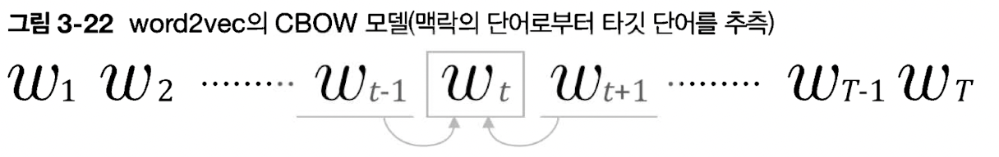

In [12]:
Image("/Users/choeunsol/Python/주피터 이미지용 사진/ch3_22.png")

그럼 맥락으로 $w_{t-1}, w_{t+1}$이 주어졌을 대, 타깃이 $w_t$가 될 확률은 수식으로 어떻게 나타낼까? 사후 확률을 이용해 다음과 같이 쓸 수 있다.

$$P(w_t | w_{t-1}, w_{t+1})$$

이는 $w_{t-1}, w_{t+1}$이 일어난 후 $w_t$가 일어날 확률을 말한다. 즉, CBOW는 **이 확률을 모델링하고 있는 것** 이다.

이를 이용하면 CBOW 모델의 손실 함수도 간결하게 표현할 수 있다. 교차 엔트로피 오차를 적용해보자. 참고로 교차 엔트로피 오차의 식은;

$$L = -\sum_k t_k logy_k$$

이 때 $y_k$는 **$k$번째에 해당하는 사건이 일어날 확률** 을 의미한다. 그리고 $t_k$는 정답 레이블이며, 원핫 벡터로 표현된다.

여기서 문제의 정답은 $w_t$가 발생하는 것이므로 $w_t$에 해당하는 원소만 1이고 나머지는 0이 된다. 즉, $w_t$ 이외의 일이 이러날 경우에 대해서는 해당 원핫 레이블의 요소는 0이 된다. 이 점을 감안하면 다음의 식을 유도할 수 있다.

$$L = -logP(w_t | w_{t-1}, w_{t+1})$$

이 식은 샘플 데이터 하나에 대한 손실 함수이며, 이를 말뭉치 전체로 확장하면 다음 식이 된다.

$$L = -\frac{1}{T}\sum_{t=1}^{T} logP(w_t | w_{t-1}, w_{t+1})$$

이 식에서 보듯, CBOW 모델의 손실 함수는 확률에 $log$를 취한 다음 마이너스를 붙이면 된다. 이를 **음의 로그 가능도**라고 한다..

CBOW 모델의 ㅎ학습이 수행하는 일은 이 손실 함수의 값을 **가능한 한 작게 만드는 것**이다. 그리고 이때의 가중치 매개변수가 우리가 얻고자 하는 **단어의 분산 표현**인 것이다. 여기에서는 윈도우 크기가 1인 경우만 생각했지만, 다른 크기(또는 $m$ 등의 범용적인 크기)라 해도 수식으로 쉽게 나타낼 수 있다.

### skip-gram 모델

word2vec은 2개의 모델을 제안하고 있다. 하나는 지금까지 본 CBOW 모델이고, 다른 하나는 skip-gram 모델이다. skip-gram은 CBOW에서 다루는 **맥락과 타깃을 역전시킨 모델** 이다. 구체적인 예를 살펴보자.

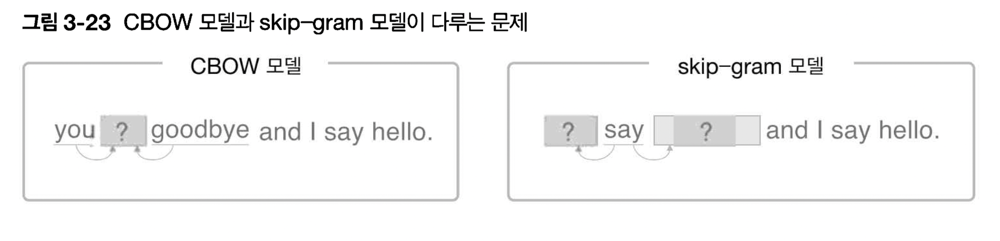

In [13]:
Image("/Users/choeunsol/Python/주피터 이미지용 사진/ch3_23.png")

CBOW 모델은 맥락이 여러 개 있고, **그 여러 맥락으로부터 중앙의 단어(타깃)을 추측**한다.

skip-gram 모델은 **중앙의 단어(타깃)으로부터 주변의 여러 단어(맥락)** 을 추측한다.

skip-gram 모델의 신경망 구성은 다음과 같다.

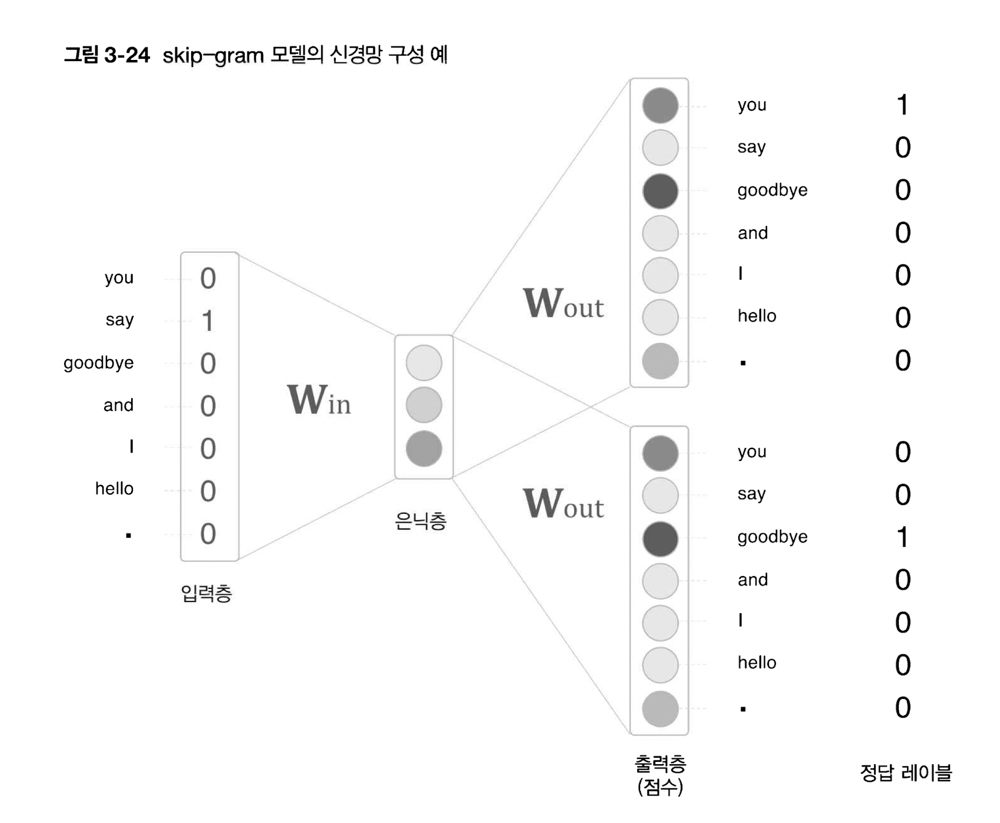

In [14]:
Image("/Users/choeunsol/Python/주피터 이미지용 사진/ch3_24.png")

그림에서 보듯 skip-gram 모델의 입력층은 하나이다. 한편 출력층은 맥락의 수만큼 존재한다.

따라서 각 출력층에서는 **개별적으로 손실을 구하고, 이 개별 손실을 모두 더한 값을 최종 손실**로 한다.

그렇다면 skip-gram 모델을 확률 표기로 나타내보자. 중앙 단어(타깃) $w_t$로부터 맥락인 $w_{t-1}, w_{t+1}$을 추측하는 경우를 생각해보자. 그렇다면 skip-gram은 다음의 식을 모델링하는 게 된다.

$$P(w_{t-1}, w_{t+1}|w_t)$$

여기서 skip-gram 모델에서는 맥락의 단어들 사이에 관련성이 없다고 가정하고 다음과 같이 분해한다.

$$P(w_{t-1}, w_{t+1}|w_t) = P(w_{t-1}|w_t)P(w_{t+1}|w_t)$$

이를 교차 엔트로피 오차에 적용하여 skip-gram 모델의 손실 함수를 유도할 수 있다.

$$\begin{align} L & = -logP(w_{t-1}, w_{t+1}|w_t) \\
& = -logP(w_{t-1} | w_t)P(w_{t+1} | w_t) \\
& = -(logP(w_{t-1} | w_t) + logP(w_{t+1} | w_t)) \end{align}$$

이 유도 과정에서는 $logxy = logx + logy$라는 로그의 성질을 이용했다. skip-gram 모델의 손실 함수는 **맥락별 손실을 구한 다음 모두 더한다.**

이를 말뭉치 전체로 확장하면 skip-gram 모델의 손실 함수는 다음과 같다.

$$L = -\frac{1}{T} \sum_{t=1}^T (logP(w_{t-1}|w_t) + logP(w_{t+1}|w_t))$$

이 식을 CBOW 모델과 비교하면 그 차이가 선명해질 것이다. skip-gram 모델은 맥락의 수만큼 추측하기 때문에 그 손실 함수는 **각 맥락에서 구한 손실의 총합**이어야 한다.

반면 CBOW 모델은 **타깃 하나의 손실**을 구한다.

그렇다면 CBOW 모델과 skip-gram 모델 중 어느 것을 사용해야 할까? 그 대답은 skip-gram 모델이 될 것이다.

특히 말뭉치가 커질수록 저빈도 단어나 유추 문제의 성능 면에서 skip-gram 모델이 더 뛰어난 경향이 있다.

반면, 학습 속도 면에서는 CBOW 모델이 더 빠르다. skip-gram 모델은 손실을 맥락의 수만큼 구해야 해서 계산 비용이 그만큼 커지기 때문이다.

<font color = blue> skip-gram 모델은 하나의 단어로부터 그 주변 단어들을 예측한다. 이는 꽤 어려운 문제라고 할 수 있다. 예를 들어 [그림 3-23]의 문제를 윌가 푼다고 생각해보면, CBOW 모델의 문제라면 "say"라고 쉽게 답할 수 있을 것이지만, skip-gram 모델의 문제라면 여러 가지가 떠오를 것이다. 이런 점에서 skip-gram 모델이 더 어려운 문제에 도전한다고 할 수 있다. 그리고 더 어려운 상황에서 단련하는 만큼 skip-gram 모델이 내어 주는 **단어의 분산 표현이 더 뛰어날 가능성이 커지는 것**이다. </font>

CBOW 모델의 구현을 이해할 수 있다면 skip-gram 모델의 구현도 특별히 어려울 것이 없다.

In [16]:
from common.layers import MatMul, SoftmaxWithLoss

class skip_gram:
    def __init__(self, vocab_size, hidden_size):
        V, H = vocab_size, hidden_size
        self.W_in = 0.01 * np.random.randn(V, H)
        self.W_out = 0.01 * np.randon.randn(H, V)
        
        layer_in = MatMul()
        layer_out = MatMul()
        layer_loss1 = SoftmaxWithLoss()
        layer_loss2 = SoftmaxWithLoss()
        self.params, self.grads = [], []
        self.layers = [layer_in, layer_out]
        for layer in self.layers:
            self.params += layer.params
            self.grads += layer.grads
        self.wordvec = W_in
    def forward(self, target, contexts):
        h = self.layer_in.forward(target)
        ho = self.layer_out.forward(h)
        loss1 = self.layer_loss1.forward(ho, contexts[:,1])
        loss2 = self.layer_loss2.forward(ho, contexts[:,2])
        loss = loss1 + loss2
        return loss
    def backward(self, dout = 1):
        dl1 = self.layer_loss1.backward(dout)
        dl2 = self.layer_loss2.backward(dout)
        dl = dl1 + dl2
        do = self.layer_out.backward(dl)
        self.layer_in.backward(do)
        return None

### 통계 기반 vs 추론 기반

지금까지 통계 기반 기법과 추론 기반 기법(특히 word2vec)을 살펴보았다. 학습하는 틀 면에서 두 기법에는 큰 차이가 있다.

통계 기반 기법은 말뭉치의 **전체 통계로부터 1회 학습**하여 단어의 분산 표현을 얻었다.

추론 기반 기법은 말뭉치를 **일부분 씩 여러 번 보면서 학습했다(미니배치 학습).**

이번 절에서는 이 두 기법이 어떻게 다른지 비교해보려 한다.

먼저, 어휘에 추가할 새 단어가 생겨서 단어의 분산 표현을 갱신해야 하는 상황을 생각해보자. 통계 기반 기법에서는 계산을 처음부터 다시 해야 한다. 단어의 분산 표현을 조금만 수정하고 싶어도, **동시발생 행렬을 만들고 SVD를 수행하는 일련의 작업을 다시 해야 한다**. 그에 반애 추론 기반 기법은 **매개변수를 다시 학습**할 수 있다. 지금까지 **학습한 가중치를 초깃값으로 사용**해 다시 학습하면 되는데, 이런 특성 덕분에 기존에 학습한 경험을 해치지 않으면서 단어의 분산 표현을 효율적으로 갱신할 수 있다.

두 기법으로 얻는 단어의 분산 표현이나 정밀도 면은 어떨까? 분산 표현의 성격에 대해 논하자면 통계 기반 기법에서는 주로 단어의 유사성이 인코딩된다. 한편 word2vec(특히 skip-gram 모델)에서는 단어의 유사성은 물론, 한층 복잡한 단어 사이의 패턴까지도 파악되어 인코딩한다.

이런 이유로 추론 기반 기법이 정확하다 할 수 있지만, 실제로 단어의 유사성을 정량 평가하면 두 기법의 큰 차이는 없었다.

또 다른 중요한 사실은, **추론 기반 기법과 통계 기반 기법은 서로 관련**되어 있다고 한다. 구체적으로는 skip-gram과 (다음 장에서 다루는) 네거티브 샘플링을 이용한 모델은 모두 말뭉치 전체의 동시발생 행렬(실제로는 살짝 수정한 행렬)에 특수한 행렬 분해를 적용한 것과 같다. 다시 말해, 두 기법은 (특정 조건 하에서) 서로 연결되어 있다.

나아가 word2vec 이후 추론 기반 기법과 통계 기반 기법을 융합한 GloVe 기법이 등장했다. GloVe의 기본 아이디어는 말뭉치 전체의 통계 정보를 손실 함수에 도입해 미니배치 학습을 하는 것이다.